In [1]:
import logging
import warnings
from pathlib import Path

import numpy as np
import pytorch_lightning as pl
import torch
from torchvision.utils import make_grid
from matplotlib import pyplot as plt
from pytorch_lightning import loggers as pl_loggers
from pytorch_lightning.callbacks import RichProgressBar, ModelCheckpoint

In [2]:
from zprp.models.cycle_gan.data import CycleGanDataModule
from zprp.models.cycle_gan.model import CycleGAN

In [3]:
LOG_PATH = "lightning_logs"
LOG_NAME = "cyclegan_lambdas_experiment"
DATA_PATH = Path("../data")

In [4]:
torch.set_float32_matmul_precision("high")
# lightning complaining about using only one worker in DataLoader
warnings.filterwarnings("ignore", ".*does not have many workers.*")
# silence hardware summary on every `fit`
logging.getLogger("pytorch_lightning").setLevel(logging.WARNING)

In [5]:
CONTENT_PATH = DATA_PATH / "photo/0"
STYLE_PATH = DATA_PATH / "monet/0"

In [6]:
def unnormalize(x: torch.Tensor) -> torch.Tensor:
    return (x * 0.5) + 0.5

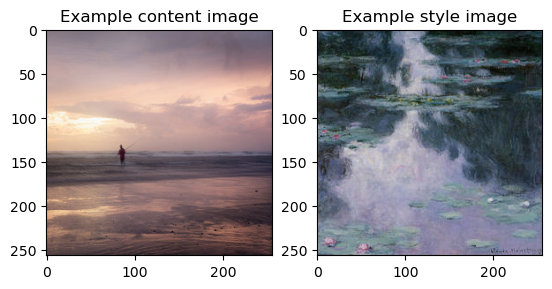

In [7]:
dm = CycleGanDataModule(content_path=CONTENT_PATH, style_path=STYLE_PATH, n_val_images=64, batch_size=4, img_size=256)
dm.setup("fit")

content_img, style_img = next(iter(dm.train_dataloader()))

fix, axes = plt.subplots(1, 2)

axes[0].imshow(np.transpose(unnormalize(content_img[0]), axes=(1, 2, 0)))
axes[0].set_title("Example content image")
axes[1].imshow(np.transpose(unnormalize(style_img[0]), axes=(1, 2, 0)))
axes[1].set_title("Example style image")
plt.show()

In [8]:
epochs = 30

In [9]:
plt.rcParams["figure.figsize"] = (18, 11)


def show_images(model, title):
    device = torch.device("cuda") if torch.cuda.is_available else torch.device("cpu")

    model.eval()
    model.g.eval()
    model.f.eval()

    images_x, images_y = next(iter(dm.val_dataloader()))
    images_x = images_x[:16].to(device)
    images_y = images_y[:16].to(device)

    with torch.no_grad():
        fake_y = model.x_to_y(images_x)
        cycle_x = model.y_to_x(fake_y)
        fake_x = model.y_to_x(images_y)
        cycle_y = model.x_to_y(fake_x)

    fig, axes = plt.subplots(2, 3)

    axes[0][0].imshow(make_grid(unnormalize(images_x), nrow=4).permute(1, 2, 0).cpu())
    axes[0][0].set_title("Real photo")
    axes[0][1].imshow(make_grid(unnormalize(fake_y), nrow=4).permute(1, 2, 0).cpu())
    axes[0][1].set_title("Fake painting")
    axes[0][2].imshow(make_grid(unnormalize(cycle_x), nrow=4).permute(1, 2, 0).cpu())
    axes[0][2].set_title("Recreated photo")

    axes[1][0].imshow(make_grid(unnormalize(images_y), nrow=4).permute(1, 2, 0).cpu())
    axes[1][0].set_title("Real painting")
    axes[1][1].imshow(make_grid(unnormalize(fake_x), nrow=4).permute(1, 2, 0).cpu())
    axes[1][1].set_title("Fake photo")
    axes[1][2].imshow(make_grid(unnormalize(cycle_y), nrow=4).permute(1, 2, 0).cpu())
    axes[1][2].set_title("Recreated painting")

    for ax in axes.reshape(-1):
        ax.axis("off")

    if title:
        fig.suptitle(title, size=22)

    plt.show()

# Training
$$
L(G, F, D_X, D_Y) = \mathcal{L}_{GAN}(G, D_Y, X, Y) + \mathcal{L}_{GAN}(F, D_X, Y, X) + \lambda \mathcal{L}_{cyc}(G, F)
$$
from https://arxiv.org/pdf/1703.10593
- update the discriminators with \mathcal{L}_{GAN} (adversarial losses)
- update the generators with \mathcal{L}_{GAN} and \mathcal{L}_{cyc} (adversarial and cycle consistency losses)

┏━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃   ┃ Name                   ┃ Type                 ┃ Params ┃
┡━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│ 0 │ g                      │ Generator            │ 11.4 M │
│ 1 │ f                      │ Generator            │ 11.4 M │
│ 2 │ dx                     │ Discriminator        │  2.8 M │
│ 3 │ dy                     │ Discriminator        │  2.8 M │
│ 4 │ lsgan_loss             │ LSGANLoss            │      0 │
│ 5 │ cycle_consistency_loss │ CycleConsistencyLoss │      0 │
└───┴────────────────────────┴──────────────────────┴────────┘

Trainable params: 28.3 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 28.3 M                                                                                               
Total estimated model params size (MB): 113

Output()

/home/tomek/miniconda3/envs/zprp/lib/python3.11/site-packages/pytorch_lightning/trainer/call.py:54: Detected 
KeyboardInterrupt, attempting graceful shutdown...

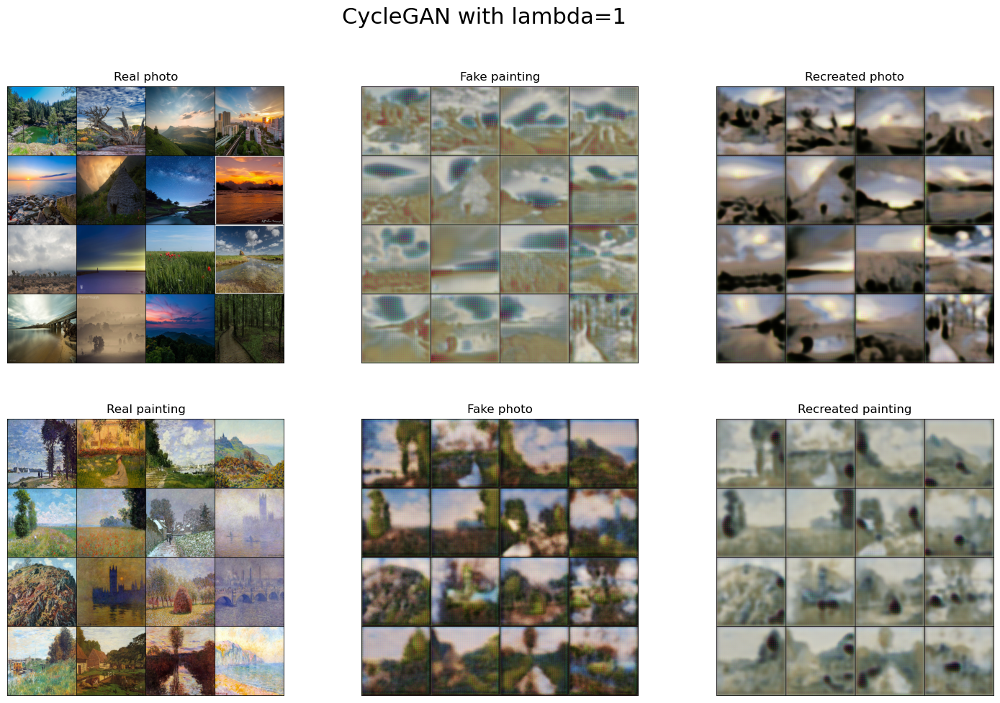

┏━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃   ┃ Name                   ┃ Type                 ┃ Params ┃
┡━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│ 0 │ g                      │ Generator            │ 11.4 M │
│ 1 │ f                      │ Generator            │ 11.4 M │
│ 2 │ dx                     │ Discriminator        │  2.8 M │
│ 3 │ dy                     │ Discriminator        │  2.8 M │
│ 4 │ lsgan_loss             │ LSGANLoss            │      0 │
│ 5 │ cycle_consistency_loss │ CycleConsistencyLoss │      0 │
└───┴────────────────────────┴──────────────────────┴────────┘

Trainable params: 28.3 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 28.3 M                                                                                               
Total estimated model params size (MB): 113

Output()

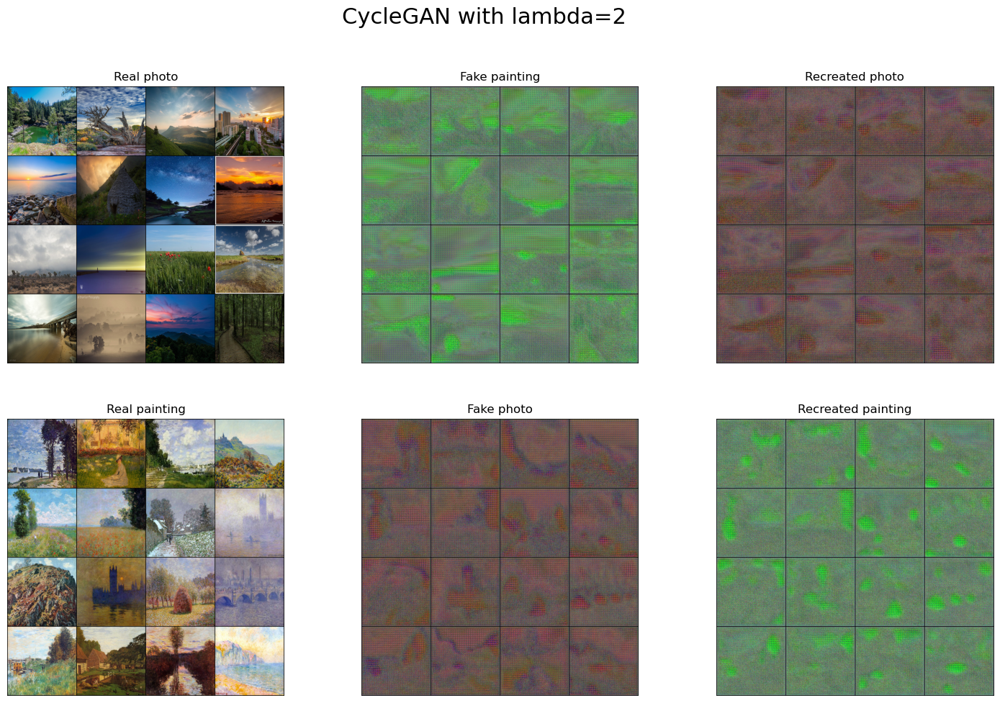

┏━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃   ┃ Name                   ┃ Type                 ┃ Params ┃
┡━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│ 0 │ g                      │ Generator            │ 11.4 M │
│ 1 │ f                      │ Generator            │ 11.4 M │
│ 2 │ dx                     │ Discriminator        │  2.8 M │
│ 3 │ dy                     │ Discriminator        │  2.8 M │
│ 4 │ lsgan_loss             │ LSGANLoss            │      0 │
│ 5 │ cycle_consistency_loss │ CycleConsistencyLoss │      0 │
└───┴────────────────────────┴──────────────────────┴────────┘

Trainable params: 28.3 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 28.3 M                                                                                               
Total estimated model params size (MB): 113

Output()

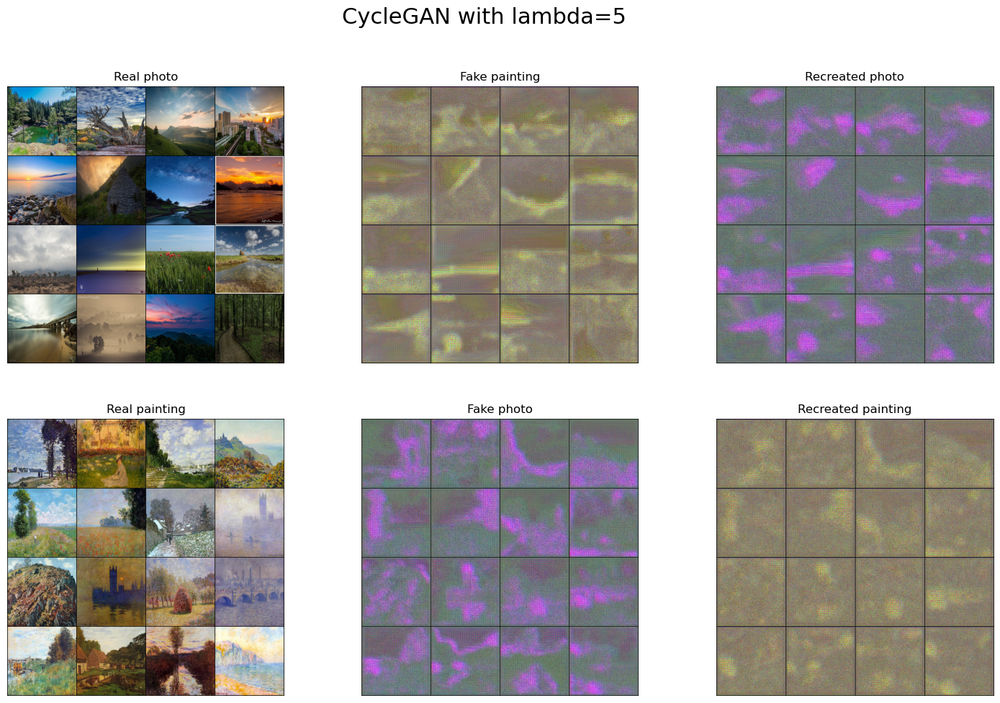

┏━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃   ┃ Name                   ┃ Type                 ┃ Params ┃
┡━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│ 0 │ g                      │ Generator            │ 11.4 M │
│ 1 │ f                      │ Generator            │ 11.4 M │
│ 2 │ dx                     │ Discriminator        │  2.8 M │
│ 3 │ dy                     │ Discriminator        │  2.8 M │
│ 4 │ lsgan_loss             │ LSGANLoss            │      0 │
│ 5 │ cycle_consistency_loss │ CycleConsistencyLoss │      0 │
└───┴────────────────────────┴──────────────────────┴────────┘

Trainable params: 28.3 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 28.3 M                                                                                               
Total estimated model params size (MB): 113

Output()

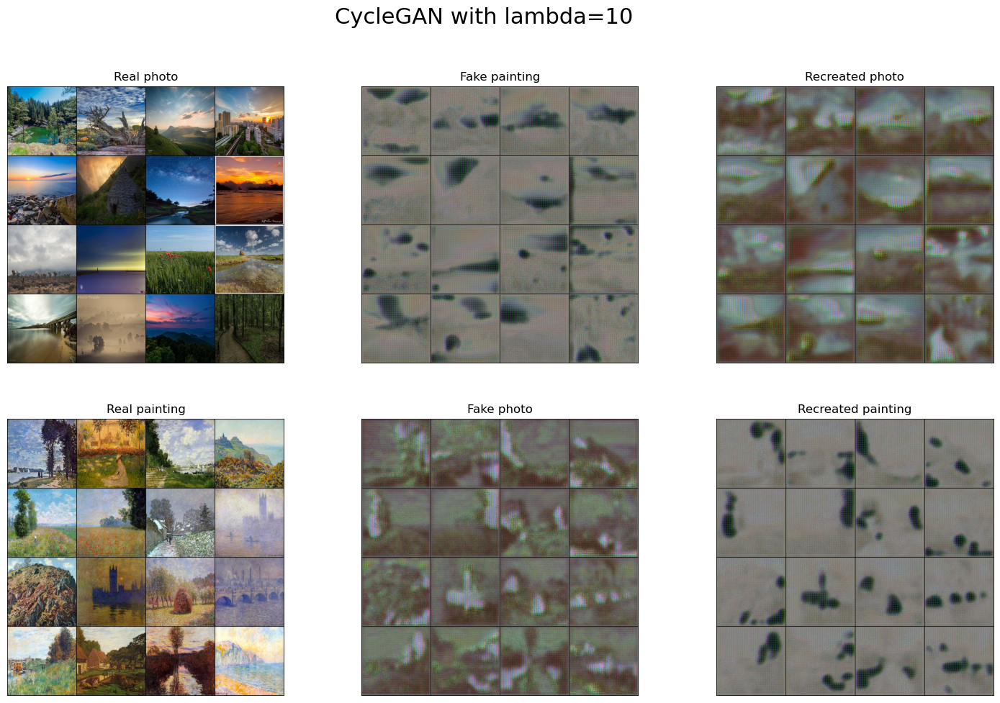

┏━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃   ┃ Name                   ┃ Type                 ┃ Params ┃
┡━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│ 0 │ g                      │ Generator            │ 11.4 M │
│ 1 │ f                      │ Generator            │ 11.4 M │
│ 2 │ dx                     │ Discriminator        │  2.8 M │
│ 3 │ dy                     │ Discriminator        │  2.8 M │
│ 4 │ lsgan_loss             │ LSGANLoss            │      0 │
│ 5 │ cycle_consistency_loss │ CycleConsistencyLoss │      0 │
└───┴────────────────────────┴──────────────────────┴────────┘

Trainable params: 28.3 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 28.3 M                                                                                               
Total estimated model params size (MB): 113

Output()

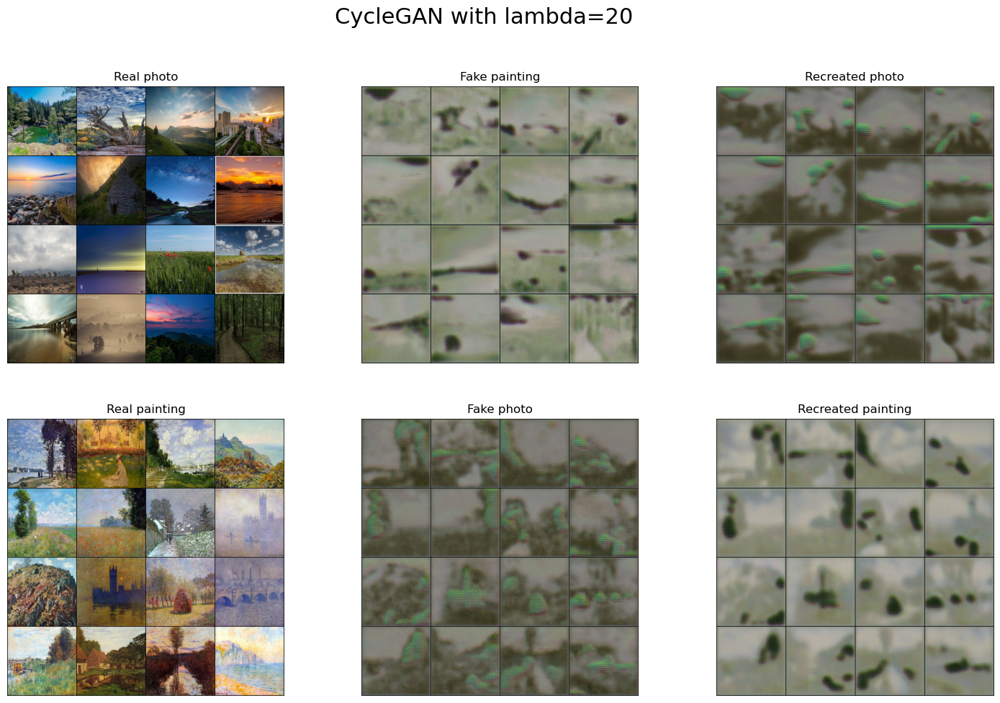

In [10]:
lambdas = [1, 2, 5, 10, 20]

for lambda_param in lambdas:
    tb_logger = pl_loggers.TensorBoardLogger(save_dir=LOG_PATH, name=f"{LOG_NAME}_l{lambda_param}")

    model = CycleGAN(lambda_param=lambda_param, optimizer_kwargs={"lr": 0.0002, "betas": (0.5, 0.999)})

    periodic_callback = ModelCheckpoint(
        save_top_k=-1,
        every_n_epochs=5,
        filename="checkpoint_periodic-{epoch:04d}",
    )

    trainer = pl.Trainer(
        max_epochs=epochs,
        logger=tb_logger,
        log_every_n_steps=1,
        callbacks=[
            RichProgressBar(refresh_rate=1),
            periodic_callback,
        ],
    )
    trainer.fit(model, dm)

    model.eval()
    show_images(model, f"CycleGAN with lambda={lambda_param}")

- lower lambda values encourage more style transfer, but in the extreme case of lambda = 1, the content is not preserved at all
- higher lambda values encourage more content preservation, but in the extreme case of lambda = 20, the style is not transferred at all
- cycle